In [4]:
# Load necessary libraries
import sys
import os
import anndata as ad
import pandas as pd
import scanpy as sc
import seaborn as sns; sns.set(color_codes=True)



In [5]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.8.1 anndata==0.8.0 umap==0.5.2 numpy==1.21.5 scipy==1.6.0 pandas==1.3.5 scikit-learn==0.24.2 statsmodels==0.13.1 pynndescent==0.5.6


In [6]:
sc.logging.print_header()

scanpy==1.8.1 anndata==0.8.0 umap==0.5.2 numpy==1.21.5 scipy==1.6.0 pandas==1.3.5 scikit-learn==0.24.2 statsmodels==0.13.1 pynndescent==0.5.6


In [7]:
reg001 = pd.read_csv('stardist_detections.txt', sep='\t', header=0, index_col=0)
combinedDF = pd.concat([reg001])
combinedDF.reset_index(inplace=True)
combinedDF.head()

/tmp/ipykernel_109/1821550824.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  combinedDF.reset_index(inplace=True)


,Image,Name,Class,Parent,ROI,Centroid X µm,Centroid Y µm,Detection probability,Nucleus: Area µm^2,Nucleus: Length µm,...,CD34: Membrane: Mean,CD34: Membrane: Median,CD34: Membrane: Min,CD34: Membrane: Max,CD34: Membrane: Std.Dev.,CD34: Cell: Mean,CD34: Cell: Median,CD34: Cell: Min,CD34: Cell: Max,CD34: Cell: Std.Dev.
0,HNSCC_RB15P48811_20220202_NM_Scan2.qptiff - re...,PathCellObject,NaN,PathAnnotationObject,Polygon,8333.4,4963.4,0.8835,40.8628,25.3502,...,11.0500,11.0,7,15,1.9522,11.3960,11.0,7,15,1.5929
1,HNSCC_RB15P48811_20220202_NM_Scan2.qptiff - re...,PathCellObject,NaN,PathAnnotationObject,Polygon,8328.2,4967.7,0.8093,36.1795,22.5107,...,10.3182,10.0,8,14,1.7087,10.5026,10.0,7,15,1.4797
2,HNSCC_RB15P48811_20220202_NM_Scan2.qptiff - re...,PathCellObject,NaN,PathAnnotationObject,Polygon,8336.1,4970.1,0.9560,48.6810,25.2409,...,10.5172,10.5,5,14,1.6884,11.0485,11.0,5,16,1.8179
3,HNSCC_RB15P48811_20220202_NM_Scan2.qptiff - re...,PathCellObject,NaN,PathAnnotationObject,Polygon,8324.0,4970.9,0.6024,19.5097,21.1491,...,9.4634,9.0,6,13,1.5984,9.7857,10.0,6,14,1.6666
4,HNSCC_RB15P48811_20220202_NM_Scan2.qptiff - re...,PathCellObject,NaN,PathAnnotationObject,Polygon,8343.9,4970.4,0.9160,31.8849,20.6762,...,9.5741,9.5,6,13,1.5492,10.1137,10.0,6,14,1.5944


In [8]:
protDF = combinedDF[[col for col in combinedDF.columns if 'Mean' in col and 'Cell:' in col]]
protDF.head()

,DAPI: Cell: Mean,Ki67: Cell: Mean,HLA-A: Cell: Mean,CD4: Cell: Mean,CD44: Cell: Mean,CD20: Cell: Mean,CD68: Cell: Mean,CD8: Cell: Mean,PanCK: Cell: Mean,CD11c: Cell: Mean,...,CD45: Cell: Mean,CD45RO: Cell: Mean,Vim: Cell: Mean,CD3e: Cell: Mean,CD21: Cell: Mean,HLA-DR: Cell: Mean,E-cad: Cell: Mean,Coll4: Cell: Mean,Podo: Cell: Mean,CD34: Cell: Mean
0,152.2200,3.2360,92.6200,47.6320,30.1640,3.7560,17.7960,28.6560,0.8960,3.5160,...,214.9520,13.9040,146.2920,40.1800,5.7720,21.9760,3.6400,0.9520,4.4600,11.3960
1,137.0410,5.4513,101.6615,52.9385,30.4462,2.6923,14.7538,9.1641,1.2103,3.5795,...,190.5231,18.2974,147.0820,35.4615,5.4000,25.1795,3.5795,1.1385,4.4564,10.5026
2,147.3209,2.9627,102.6866,47.4328,28.2239,3.7836,13.4142,17.6455,1.1269,3.2276,...,186.8470,15.1903,133.6642,40.5000,5.5373,28.4104,3.5858,1.2276,4.0149,11.0485
3,131.8333,5.5952,126.0714,57.0556,32.1349,4.7063,13.0635,11.4365,0.9762,3.4048,...,186.2937,17.8254,143.6429,37.6905,5.3968,28.5397,4.0397,0.9762,3.8889,9.7857
4,127.5255,2.4118,83.1922,40.4275,28.9765,2.6275,17.6627,18.4824,0.9961,3.0118,...,161.8196,9.8235,111.1059,33.1255,4.9373,28.5451,3.3961,1.0706,3.8863,10.1137


In [9]:
newNames = {col:col.split(':')[0] for col in protDF.columns}
protDF.rename(newNames, inplace=True, axis=1)
protDF.head()

/opt/conda/envs/rapids/lib/python3.8/site-packages/pandas/core/frame.py:5039: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


,DAPI,Ki67,HLA-A,CD4,CD44,CD20,CD68,CD8,PanCK,CD11c,...,CD45,CD45RO,Vim,CD3e,CD21,HLA-DR,E-cad,Coll4,Podo,CD34
0,152.2200,3.2360,92.6200,47.6320,30.1640,3.7560,17.7960,28.6560,0.8960,3.5160,...,214.9520,13.9040,146.2920,40.1800,5.7720,21.9760,3.6400,0.9520,4.4600,11.3960
1,137.0410,5.4513,101.6615,52.9385,30.4462,2.6923,14.7538,9.1641,1.2103,3.5795,...,190.5231,18.2974,147.0820,35.4615,5.4000,25.1795,3.5795,1.1385,4.4564,10.5026
2,147.3209,2.9627,102.6866,47.4328,28.2239,3.7836,13.4142,17.6455,1.1269,3.2276,...,186.8470,15.1903,133.6642,40.5000,5.5373,28.4104,3.5858,1.2276,4.0149,11.0485
3,131.8333,5.5952,126.0714,57.0556,32.1349,4.7063,13.0635,11.4365,0.9762,3.4048,...,186.2937,17.8254,143.6429,37.6905,5.3968,28.5397,4.0397,0.9762,3.8889,9.7857
4,127.5255,2.4118,83.1922,40.4275,28.9765,2.6275,17.6627,18.4824,0.9961,3.0118,...,161.8196,9.8235,111.1059,33.1255,4.9373,28.5451,3.3961,1.0706,3.8863,10.1137


In [10]:
protDF = protDF.drop(['DAPI'], axis=1)
protDF

,Ki67,HLA-A,CD4,CD44,CD20,CD68,CD8,PanCK,CD11c,CD14,...,CD45,CD45RO,Vim,CD3e,CD21,HLA-DR,E-cad,Coll4,Podo,CD34
0,3.2360,92.6200,47.6320,30.1640,3.7560,17.7960,28.6560,0.8960,3.5160,5.6400,...,214.9520,13.9040,146.2920,40.1800,5.7720,21.9760,3.6400,0.9520,4.4600,11.3960
1,5.4513,101.6615,52.9385,30.4462,2.6923,14.7538,9.1641,1.2103,3.5795,5.0359,...,190.5231,18.2974,147.0820,35.4615,5.4000,25.1795,3.5795,1.1385,4.4564,10.5026
2,2.9627,102.6866,47.4328,28.2239,3.7836,13.4142,17.6455,1.1269,3.2276,5.1754,...,186.8470,15.1903,133.6642,40.5000,5.5373,28.4104,3.5858,1.2276,4.0149,11.0485
3,5.5952,126.0714,57.0556,32.1349,4.7063,13.0635,11.4365,0.9762,3.4048,5.4365,...,186.2937,17.8254,143.6429,37.6905,5.3968,28.5397,4.0397,0.9762,3.8889,9.7857
4,2.4118,83.1922,40.4275,28.9765,2.6275,17.6627,18.4824,0.9961,3.0118,4.8863,...,161.8196,9.8235,111.1059,33.1255,4.9373,28.5451,3.3961,1.0706,3.8863,10.1137
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77580,3.3209,27.7015,11.0970,28.8284,5.4328,22.2090,8.5224,1.0970,2.0522,4.4104,...,82.5970,4.1269,163.7910,11.5672,5.2164,6.1418,6.6119,0.8284,3.2761,10.4851
77581,3.0268,44.4765,28.4430,34.3490,9.0738,27.8926,15.3960,1.2752,3.6242,6.7584,...,167.1409,7.4631,124.3691,28.0067,6.7450,15.2081,5.5705,1.2282,4.3423,11.2550
77582,2.8145,39.4842,16.6561,50.3122,4.9276,27.9955,13.9367,1.1131,2.6516,5.9457,...,110.3394,6.8778,120.7240,17.0905,4.8100,5.7692,5.6878,0.9367,3.1900,11.1584
77583,2.6592,44.1070,23.2845,27.8958,11.6592,17.8732,11.0254,1.0338,2.8592,4.6366,...,134.6310,4.4648,105.2986,23.4310,5.6732,15.8282,5.3577,0.9324,4.0732,11.3803


In [11]:
spatialCols = ['Centroid X µm','Centroid Y µm','Cell: Area µm^2']
spatialNames  = {'Centroid X µm':'spatial_X','Centroid Y µm': 'spatial_Y','Cell: Area µm^2': 'Area'}#,'Image':'ImageID'}
spatDF = combinedDF[spatialCols]
spatDF['ImageID'] = 0
spatDF.rename(columns=spatialNames, inplace=True)
spatDF

/tmp/ipykernel_109/766938000.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spatDF['ImageID'] = 0
/opt/conda/envs/rapids/lib/python3.8/site-packages/pandas/core/frame.py:5039: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


,spatial_X,spatial_Y,Area,ImageID
0,8333.4,4963.4,61.0250,0
1,8328.2,4967.7,48.3153,0
2,8336.1,4970.1,67.6141,0
3,8324.0,4970.9,31.9999,0
4,8343.9,4970.4,63.5053,0
...,...,...,...,...
77580,8000.6,8636.3,33.7348,0
77581,8009.7,8637.7,37.3241,0
77582,7993.4,8638.9,54.9201,0
77583,8002.5,8642.5,88.8015,0


In [12]:
# Load data
# combine the data and metadata file to generate the AnnData object
adata = ad.AnnData (protDF)
adata.obs = spatDF

/tmp/ipykernel_109/3757403338.py:3: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = ad.AnnData (protDF)
/opt/conda/envs/rapids/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [17]:
adata.X

array([[1.4436195 , 4.539244  , 3.8842816 , ..., 0.6688545 , 1.6974487 ,
        2.5173738 ],
       [1.8642817 , 4.6314373 , 3.9878445 , ..., 0.76010466, 1.6967893 ,
        2.442573  ],
       [1.3769256 , 4.6413727 , 3.8801773 , ..., 0.8009248 , 1.6124135 ,
        2.4889402 ],
       ...,
       [1.3388096 , 3.7009118 , 2.8710814 , ..., 0.66098547, 1.4327008 ,
        2.4980202 ],
       [1.2972445 , 3.8090374 , 3.1898384 , ..., 0.65876275, 1.6239718 ,
        2.5161064 ],
       [1.3873188 , 3.720291  , 3.6051881 , ..., 0.75042504, 1.5805651 ,
        2.4801538 ]], dtype=float32)

In [14]:
sc.pp.log1p(adata)
adataScaled=sc.pp.scale(adata, max_value=10, copy=True)

In [16]:
adataScaled.X

array([[ 0.0117429 ,  1.4057666 ,  0.9799751 , ..., -0.3251774 ,
        -0.8574869 , -0.07418749],
       [ 1.1289757 ,  1.6914058 ,  1.1180338 , ...,  0.1750305 ,
        -0.8589738 , -0.26766846],
       [-0.16538884,  1.7221882 ,  0.9745036 , ...,  0.39879498,
        -1.0492177 , -0.14773427],
       ...,
       [-0.26662073, -1.1916121 , -0.37071314, ..., -0.36831304,
        -1.45442   , -0.12424795],
       [-0.377013  , -0.8566097 ,  0.05421904, ..., -0.38049737,
        -1.0231569 , -0.07746585],
       [-0.13778546, -1.1315703 ,  0.6079181 , ...,  0.12196957,
        -1.121027  , -0.17046143]], dtype=float32)

In [18]:
import rapids_scanpy_funcs as rs


In [19]:
sc.tl.pca(adataScaled, svd_solver='arpack') # peform PCA
#sc.pl.pca(adataScaled, color=protDF.columns)
#sc.pl.pca(adataScaled, color=['ImageID'])


computing PCA
    with n_comps=20
    finished (0:00:00)


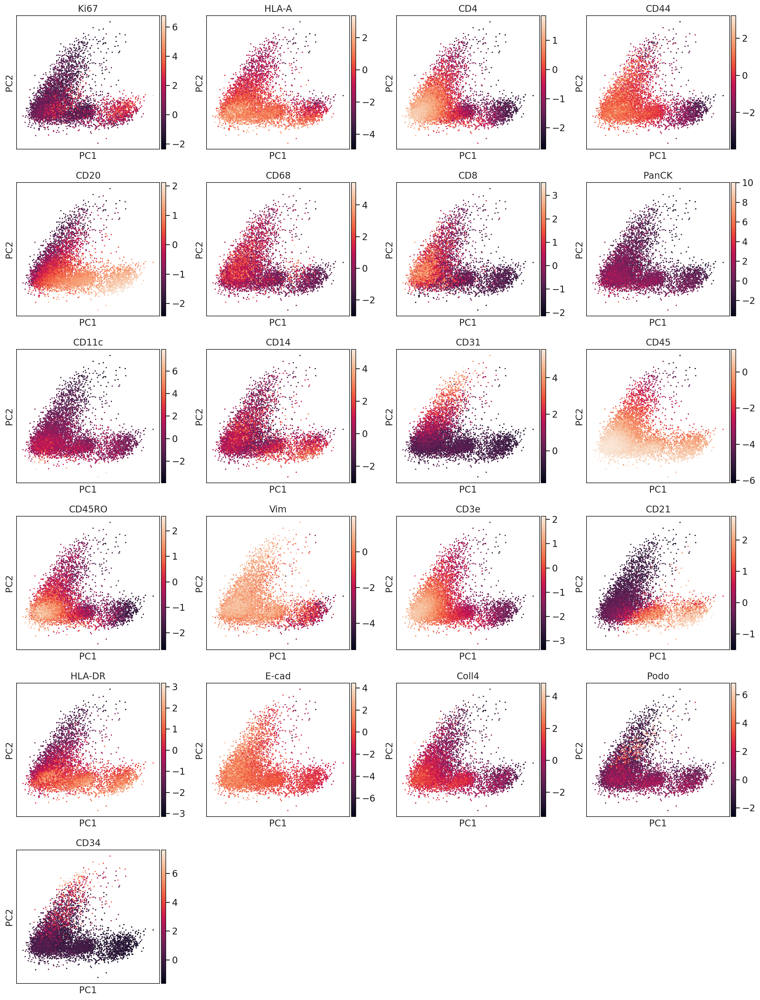

In [20]:
sc.pl.pca(sc.pp.subsample(adataScaled,fraction=0.1, copy=True), color=protDF.columns)

In [21]:
#sc.pp.neighbors(adataScaled, n_neighbors=30, n_pcs=20) # Computing the neighborhood graph
sc.pp.neighbors(adataScaled, n_neighbors=50, n_pcs=15,method='rapids') # Computing the neighborhood graph


computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:10)


In [22]:
adataScaled

AnnData object with n_obs × n_vars = 77585 × 21
    obs: 'spatial_X', 'spatial_Y', 'Area', 'ImageID'
    var: 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors'
    obsm: 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [23]:
sc.tl.umap(adataScaled,method='rapids') # Build a UMAP to visualize the neighbourhood graph


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


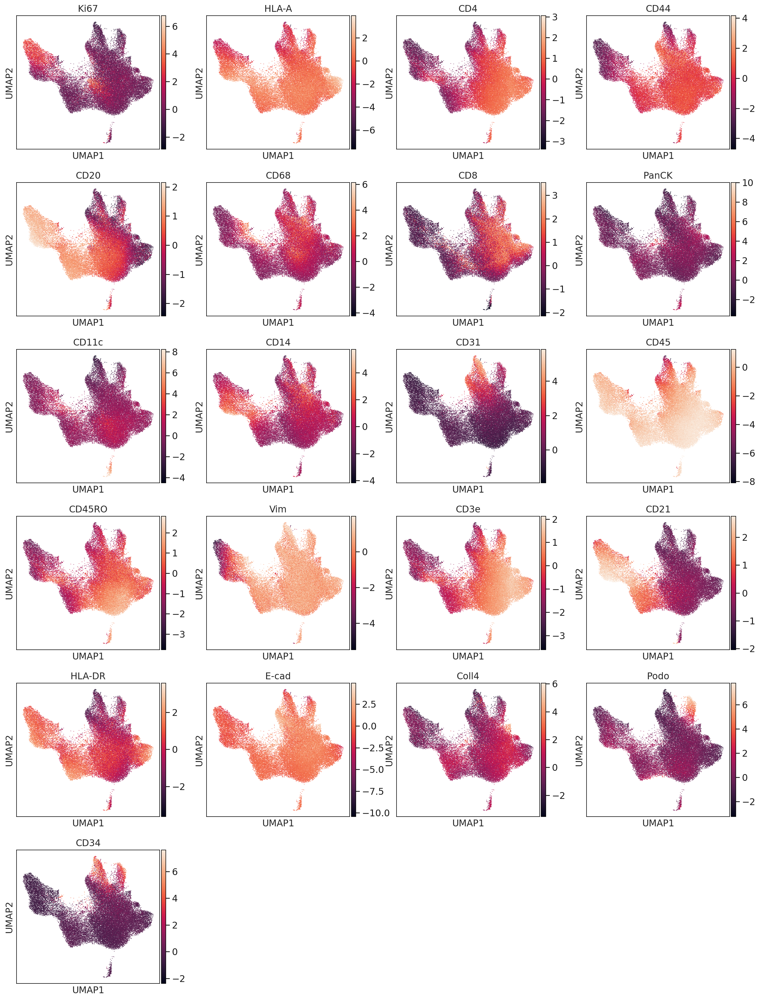

In [30]:
sc.pl.umap(sc.pp.subsample(adataScaled,fraction=0.5, copy=True), color=protDF.columns, save='x.png')


In [31]:
sc.tl.louvain(adataScaled, flavor='rapids', resolution=1.0)

running Louvain clustering
    using the "louvain" package of rapids
    finished: found 13 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:01)


In [35]:
%%time

adataScaled.obs['leiden'] = rs.leiden(adataScaled, resolution=1)
adataScaled.obs['leiden_res2'] = rs.leiden(adataScaled, resolution=2)
adataScaled.obs['leiden_res4'] = rs.leiden(adataScaled, resolution=4)

CPU times: user 812 ms, sys: 1.39 s, total: 2.2 s
Wall time: 2.51 s


In [34]:
adataScaled

AnnData object with n_obs × n_vars = 77585 × 21
    obs: 'spatial_X', 'spatial_Y', 'Area', 'ImageID', 'louvain', 'leiden'
    var: 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'louvain'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

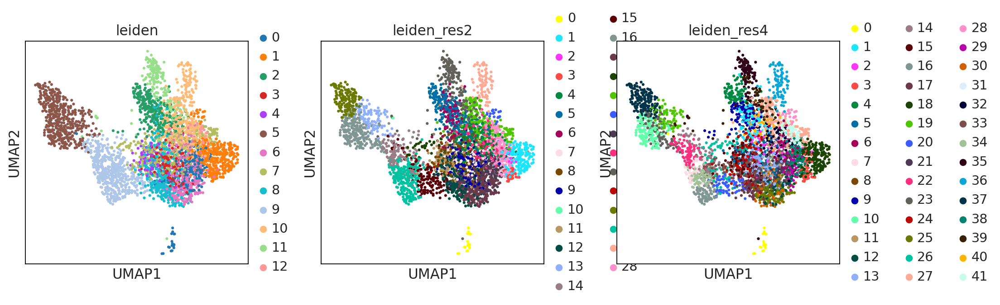

In [36]:
sc.pl.umap(sc.pp.subsample(adataScaled,fraction=0.05, copy=True), color=['leiden','leiden_res2','leiden_res4'])

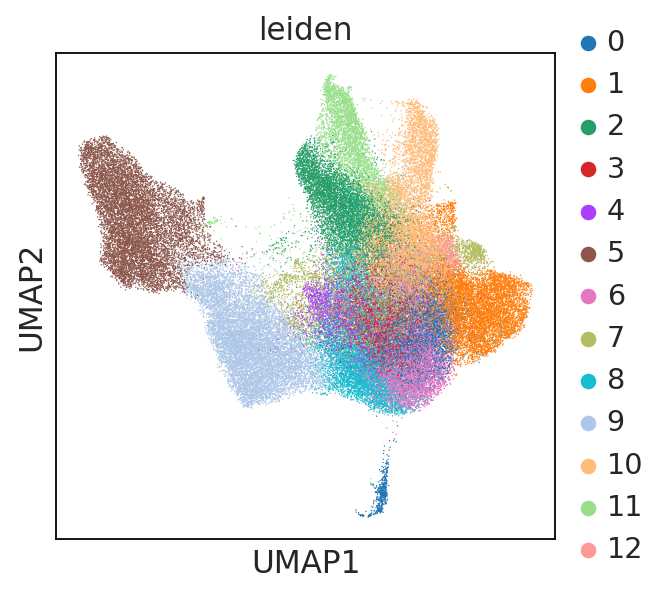

In [42]:
sc.pl.umap(adataScaled, color=['leiden'])

In [37]:
adataScaled.obs

,spatial_X,spatial_Y,Area,ImageID,louvain,leiden,leiden_res2,leiden_res4
0,8333.4,4963.4,61.0250,0,1,1,1,18
1,8328.2,4967.7,48.3153,0,1,1,1,18
2,8336.1,4970.1,67.6141,0,1,1,1,18
3,8324.0,4970.9,31.9999,0,1,1,1,18
4,8343.9,4970.4,63.5053,0,1,1,1,18
...,...,...,...,...,...,...,...,...
77580,8000.6,8636.3,33.7348,0,2,2,5,4
77581,8009.7,8637.7,37.3241,0,2,2,5,40
77582,7993.4,8638.9,54.9201,0,2,2,5,9
77583,8002.5,8642.5,88.8015,0,2,2,5,9


In [39]:
adataScaled

AnnData object with n_obs × n_vars = 77585 × 21
    obs: 'spatial_X', 'spatial_Y', 'Area', 'ImageID', 'louvain', 'leiden', 'leiden_res2', 'leiden_res4'
    var: 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'louvain', 'dendrogram_leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_leiden']`


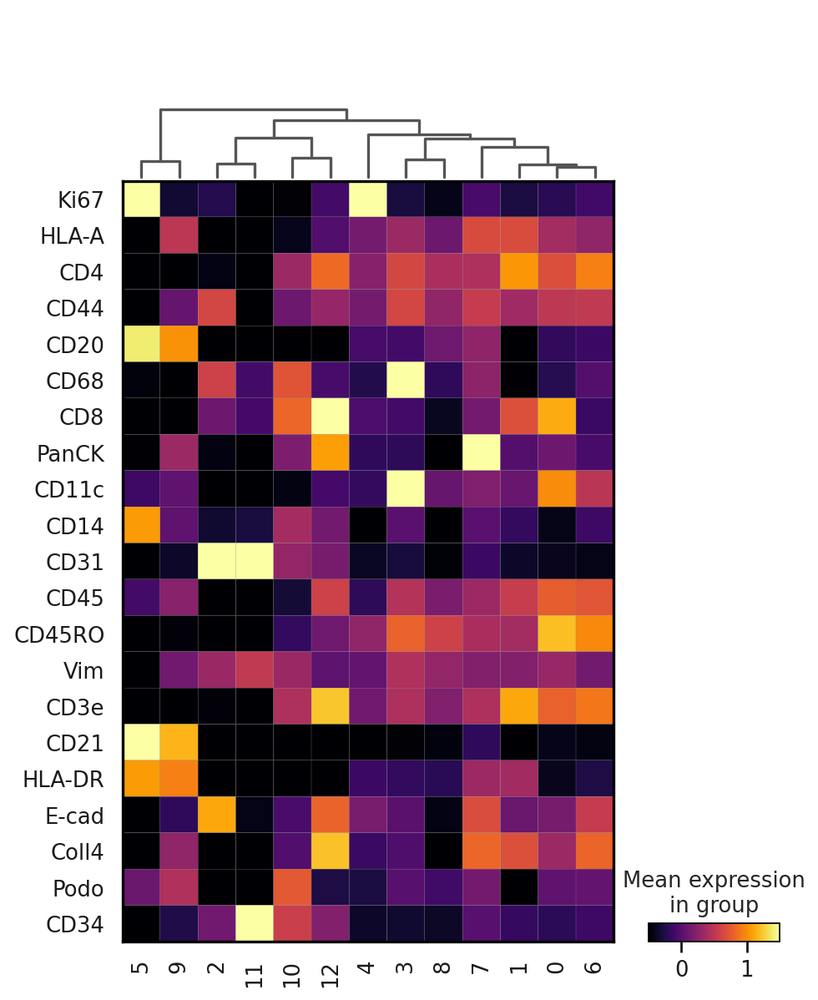

In [38]:
sc.tl.dendrogram(adataScaled, groupby='leiden')
#adataScaled.obs['State'] ='c'+adataScaled.obs['smLeiden'].astype('str')
#sc.pl.matrixplot(adataScaled, var_names= rowOrder, groupby='leiden', 
#                 dendrogram=True, use_raw=False, cmap="viridis",standard_scale='var' ,vmin=0.5)
ax2 = sc.pl.matrixplot(adataScaled, var_names = protDF.columns,groupby='leiden', 
                 dendrogram=True, use_raw=False, cmap="inferno",standard_scale=None,vmin=-0.5,vmax=1.5, return_fig=True)
sc.pl.matrixplot(adataScaled, var_names = protDF.columns,groupby='leiden', 
                 dendrogram=True, use_raw=False, cmap="inferno",standard_scale=None,vmin=-0.5,vmax=1.5, return_fig=False,swap_axes=True)

In [46]:
corrDF = protDF.corr('spearman')

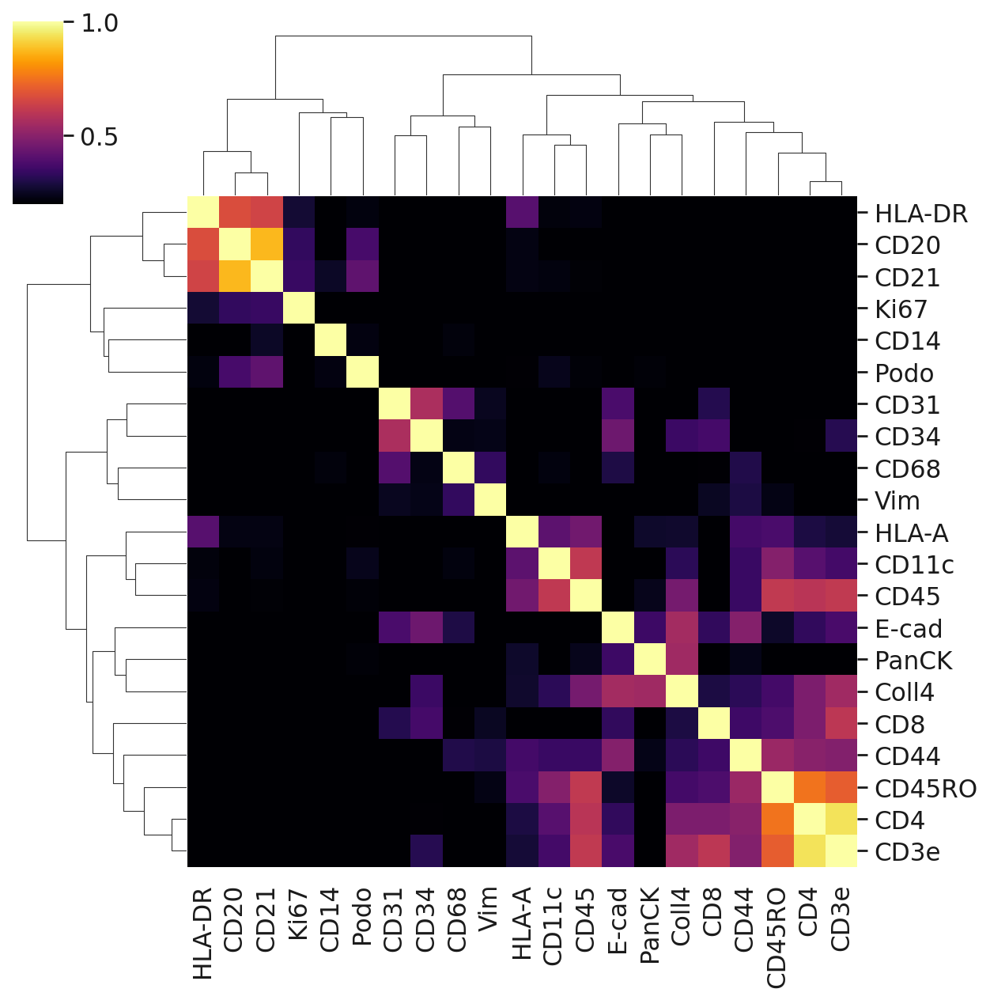

In [48]:
import matplotlib.pyplot as plt
#fig,ax=plt.subplots(1,1,figsize=(20,20))
ax3 = sns.clustermap(corrDF, vmin=0.2, vmax=1, figsize=(8,8),yticklabels=True, xticklabels=True, cmap='inferno')

In [37]:
[x.get_text() for x in ax3.ax_heatmap.get_yticklabels()]

['HLA-DR',
 'CD20',
 'CD21',
 'Ki67',
 'CD14',
 'Podo',
 'CD31',
 'CD34',
 'CD68',
 'Vim',
 'HLA-A',
 'CD11c',
 'CD45',
 'E-cad',
 'PanCK',
 'Coll4',
 'CD8',
 'CD44',
 'CD45RO',
 'CD4',
 'CD3e']

AttributeError: 'MatrixPlot' object has no attribute 'ax_heatmap'

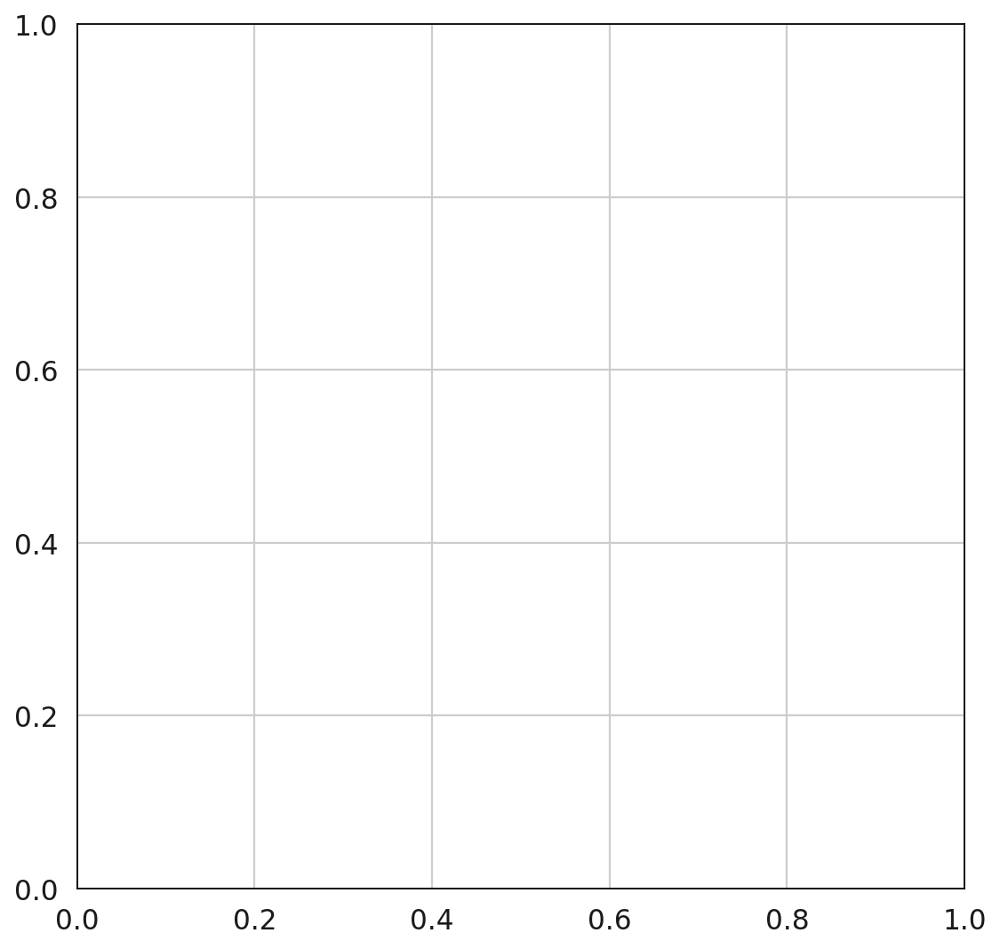

In [44]:
import matplotlib.pyplot as plt
fig,ax=plt.subplots(1,1,figsize=(8,8))
sns.heatmap(ax2.values_df.iloc[ax2.add_dendrogram().categories_idx_ordered][[x.get_text() for x in ax2.ax_heatmap.get_yticklabels()]].T,
            vmin=0, vmax=1.5, xticklabels=True, yticklabels=True, cmap='coolwarm')

In [39]:
adataScaled.obsm['X_spatial'] = adataScaled.obs[['spatial_X','spatial_Y']].values
adataScaled.obsm['X_spatial'][:,1] = -1*adataScaled.obsm['X_spatial'][:,1]
adataScaled.write('example.h5ad')

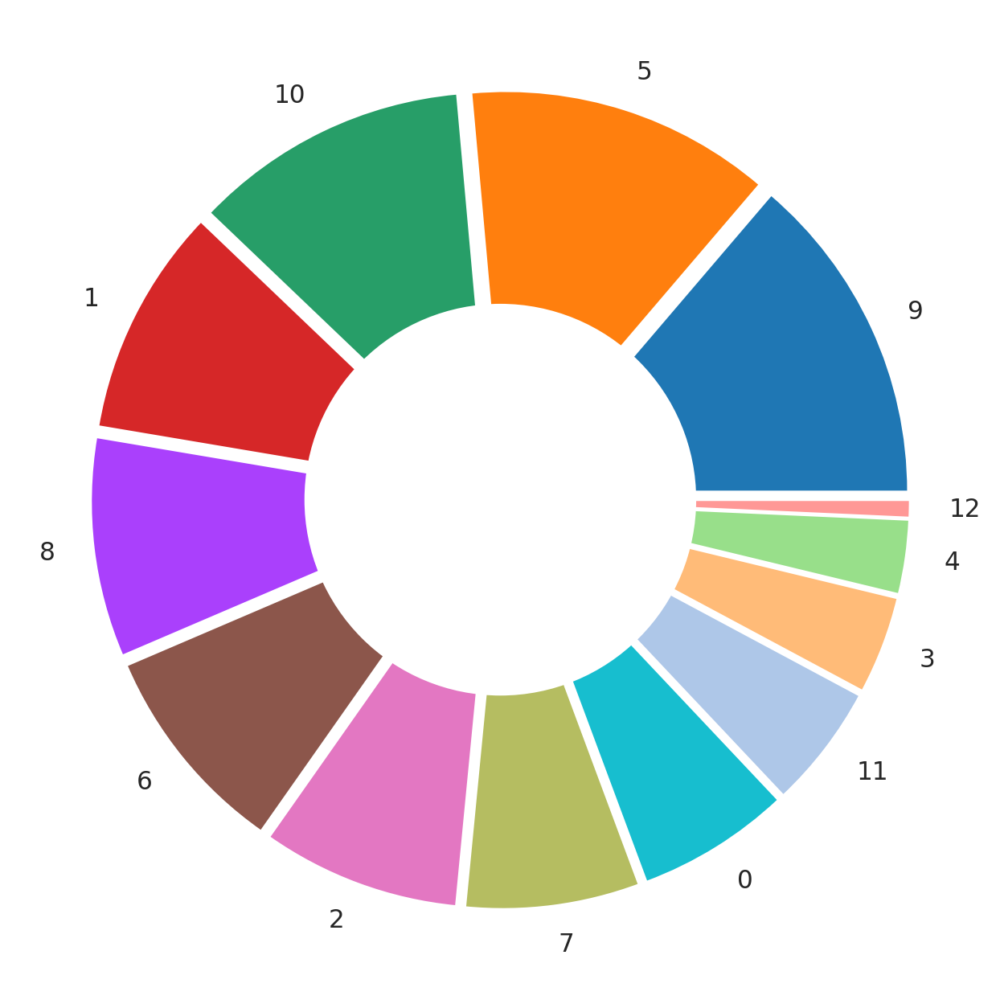

In [48]:
import matplotlib.pyplot as plt
fig,ax=plt.subplots(1,1,figsize=(8,8))
ax.pie(adataScaled.obs.leiden.value_counts(),explode=[0.05]*13,pctdistance=-0.85,startangle=0,
        labels=adataScaled.obs.leiden.value_counts().index, colors=adataScaled.uns['leiden_colors'])
#plt.set_cmap('Set2')
import matplotlib.pylab as pylab
params = {'legend.fontsize': 'x-large',
         'axes.labelsize': 32,
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
pylab.rcParams.update(params)
#draw circle
centre_circle = plt.Circle((0,0),0.50,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.tight_layout()
#plt.savefig('figures/??.png',dpi=300)

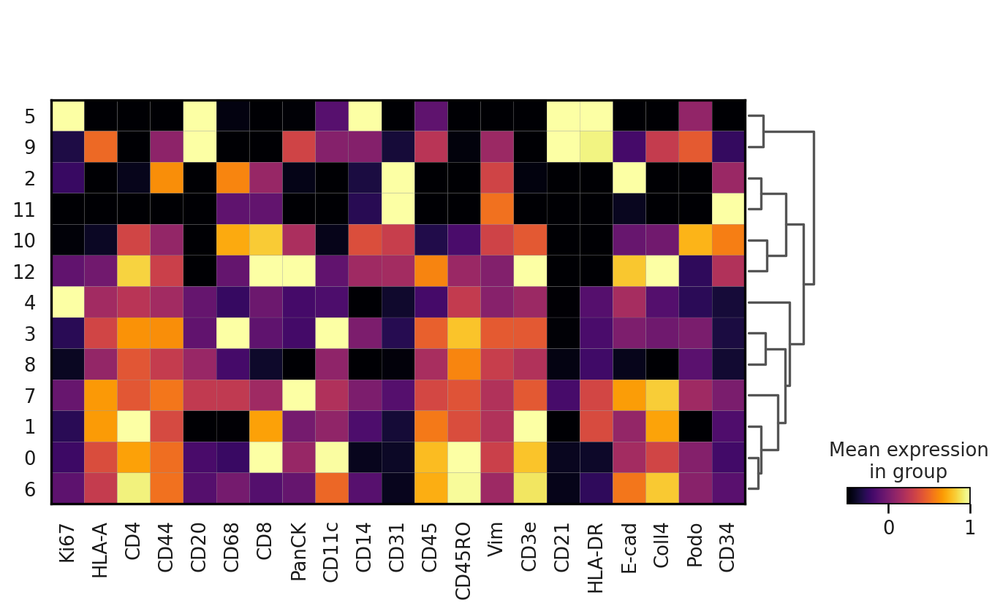

In [50]:
sc.pl.matrixplot(adataScaled, var_names = protDF.columns,groupby='leiden', 
                 dendrogram=True, use_raw=False, cmap="inferno",standard_scale=None,vmin=-0.5,vmax=1., return_fig=False, save='x.png')

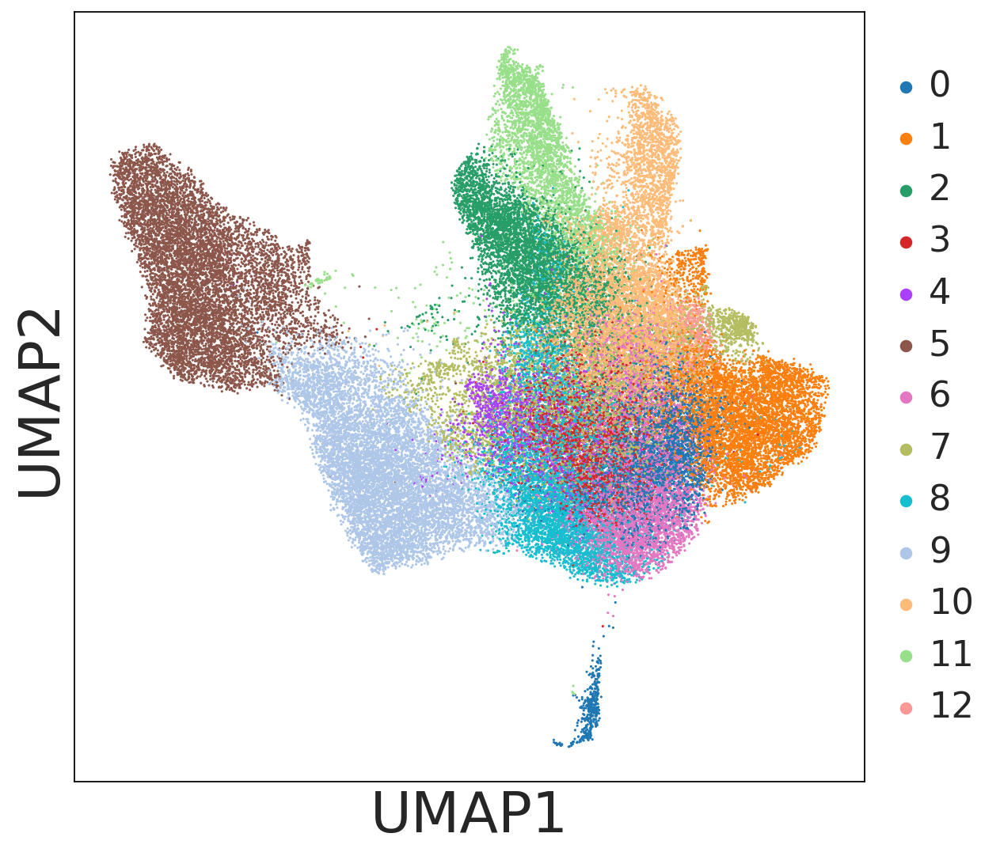

In [54]:
fig,ax=plt.subplots(1,1,figsize=(8,8))
ss = sc.pp.subsample(adataScaled,fraction=0.8, copy=True)
sc.pl.umap(ss, color=['leiden'],ax=ax,size=8,title='',save='x.png')

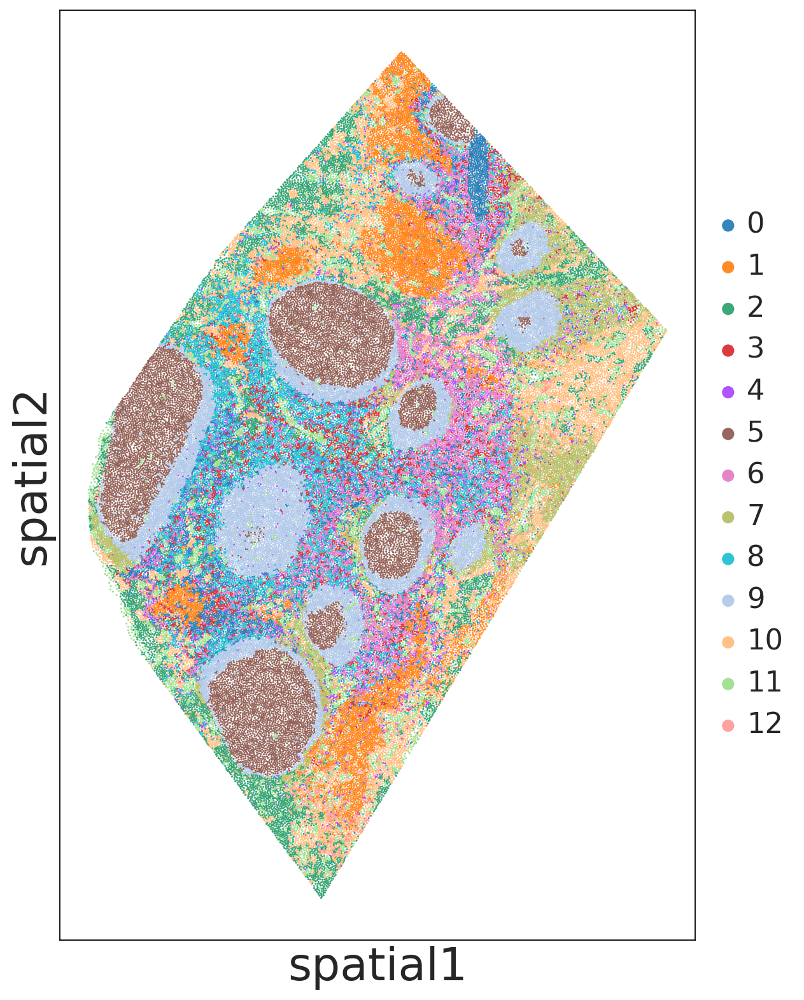

In [56]:
fig,ax=plt.subplots(1,1,figsize=(8,12))
ss = sc.pp.subsample(adataScaled,fraction=1.0, copy=True)

sc.pl.scatter(ss, basis='spatial',color=['leiden'],ax=ax,size=8,title='',save='x.png',alpha=0.9)